<a href="https://colab.research.google.com/github/mnsbharadwaj/AI-NLP/blob/master/llm_from_scratch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Educational LLM Demo Plan (Tiny Shakespeare)**

Train a character-level language model.

Generate a Shakespearean-style poem.

Explain each step clearly

Keep it light enough to run on a laptop or in Google Colab in < 5–10 mins.

In [18]:
import torch
import torch.nn as nn
from torch.nn import functional as F
import matplotlib.pyplot as plt
import requests

# Hyperparameters
batch_size = 64  # how many independent sequences will we process in parallel?
block_size = 128  # what is the maximum context length for predictions?
max_iters = 5000
eval_interval = 500
learning_rate = 3e-4
device = 'cuda' if torch.cuda.is_available() else 'cpu'
eval_iters = 200
n_embd = 256
n_head = 6
n_layer = 4
dropout = 0.1
# ------------

torch.manual_seed(1337)

# Download and prepare the dataset
url = "https://raw.githubusercontent.com/karpathy/char-rnn/master/data/tinyshakespeare/input.txt"
response = requests.get(url)
text = response.text

# Create vocabulary
chars = sorted(list(set(text)))
vocab_size = len(chars)
# Create mappings between characters and integers
stoi = { ch:i for i,ch in enumerate(chars) }
itos = { i:ch for i,ch in enumerate(chars) }
encode = lambda s: [stoi[c] for i,ch in enumerate(chars)]  # encoder: take a string, output list of integers
decode = lambda l: ''.join([itos[i] for i in l])  # decoder: take a list of integers, output string

# Train and test splits
data = torch.tensor(encode(text), dtype=torch.long)
n = int(0.9 * len(data))  # first 90% will be train, rest val
train_data = data[:n]
val_data = data[n:]

# Data loading
def get_batch(split):
    # generate a small batch of data of inputs x and targets y
    data = train_data if split == 'train' else val_data
    ix = torch.randint(len(data) - block_size, (batch_size,))
    x = torch.stack([data[i:i+block_size] for i in ix])
    y = torch.stack([data[i+1:i+block_size+1] for i in ix])
    x, y = x.to(device), y.to(device)
    return x, y

@torch.no_grad()
def estimate_loss():
    out = {}
    model.eval()
    for split in ['train', 'val']:
        losses = torch.zeros(eval_iters)
        for k in range(eval_iters):
            X, Y = get_batch(split)
            logits, loss = model(X, Y)
            losses[k] = loss.item()
        out[split] = losses.mean()
    model.train()
    return out

class Head(nn.Module):
    """ one head of self-attention """

    def __init__(self, head_size):
        super().__init__()
        self.key = nn.Linear(n_embd, head_size, bias=False)
        self.query = nn.Linear(n_embd, head_size, bias=False)
        self.value = nn.Linear(n_embd, head_size, bias=False)
        self.register_buffer('tril', torch.tril(torch.ones(block_size, block_size)))
        self.dropout = nn.Dropout(dropout)

    def forward(self, x):
        B,T,C = x.shape
        k = self.key(x)   # (B,T,C)
        q = self.query(x) # (B,T,C)
        # compute attention scores ("affinities")
        wei = q @ k.transpose(-2,-1) * C**-0.5 # (B, T, C) @ (B, C, T) -> (B, T, T)
        wei = wei.masked_fill(self.tril[:T, :T] == 0, float('-inf')) # (B, T, T)
        wei = F.softmax(wei, dim=-1) # (B, T, T)
        wei = self.dropout(wei)
        # perform the weighted aggregation of the values
        v = self.value(x) # (B,T,C)
        out = wei @ v # (B, T, T) @ (B, T, C) -> (B, T, C)
        return out

class MultiHeadAttention(nn.Module):
    """ multiple heads of self-attention in parallel """

    def __init__(self, num_heads, head_size):
        super().__init__()
        self.heads = nn.ModuleList([Head(head_size) for _ in range(num_heads)])
        self.proj = nn.Linear(num_heads * head_size, n_embd) # Fix: input dimension should be num_heads * head_size
        self.dropout = nn.Dropout(dropout)

    def forward(self, x):
        out = torch.cat([h(x) for h in self.heads], dim=-1)
        out = self.proj(out)
        out = self.dropout(out)
        return out

class FeedForward(nn.Module):
    """ a simple linear layer followed by a non-linearity """

    def __init__(self, n_embd):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(n_embd, 4 * n_embd),
            nn.ReLU(),
            nn.Linear(4 * n_embd, n_embd),
            nn.Dropout(dropout),
        )

    def forward(self, x):
        return self.net(x)

class Block(nn.Module):
    """ Transformer block: communication followed by computation """

    def __init__(self, n_embd, n_head):
        super().__init__()
        head_size = n_embd // n_head
        self.sa = MultiHeadAttention(n_head, head_size)
        self.ffwd = FeedForward(n_embd)
        self.ln1 = nn.LayerNorm(n_embd)
        self.ln2 = nn.LayerNorm(n_embd)

    def forward(self, x):
        x = x + self.sa(self.ln1(x))
        x = x + self.ffwd(self.ln2(x))
        return x

class GPTLanguageModel(nn.Module):

    def __init__(self):
        super().__init__()
        # each token directly reads off the logits for the next token from a lookup table
        self.token_embedding_table = nn.Embedding(vocab_size, n_embd)
        self.position_embedding_table = nn.Embedding(block_size, n_embd)
        self.blocks = nn.Sequential(*[Block(n_embd, n_head=n_head) for _ in range(n_layer)])
        self.ln_f = nn.LayerNorm(n_embd)
        self.lm_head = nn.Linear(n_embd, vocab_size)

        # better init
        self.apply(self._init_weights)

    def _init_weights(self, module):
        if isinstance(module, nn.Linear):
            torch.nn.init.normal_(module.weight, mean=0.0, std=0.02)
            if module.bias is not None:
                torch.nn.init.zeros_(module.bias)
        elif isinstance(module, nn.Embedding):
            torch.nn.init.normal_(module.weight, mean=0.0, std=0.02)

    def forward(self, idx, targets=None):
        B, T = idx.shape

        # idx and targets are both (B,T) tensor of integers
        tok_emb = self.token_embedding_table(idx) # (B,T,C)
        pos_emb = self.position_embedding_table(torch.arange(T, device=device)) # (T,C)
        x = tok_emb + pos_emb # (B,T,C)
        x = self.blocks(x) # (B,T,C)
        x = self.ln_f(x) # (B,T,C)
        logits = self.lm_head(x) # (B,T,vocab_size)

        if targets is None:
            loss = None
        else:
            B, T, C = logits.shape
            logits = logits.view(B*T, C)
            targets = targets.view(B*T)
            loss = F.cross_entropy(logits, targets)

        if targets is None:
            return logits # Return only logits when targets is None for tracing
        else:
            return logits, loss

    def generate(self, idx, max_new_tokens):
        # idx is (B, T) array of indices in the current context
        for _ in range(max_new_tokens):
            # crop idx to the last block_size tokens
            idx_cond = idx[:, -block_size:]
            # get the predictions
            # Note: self(idx_cond) will now return only logits here as targets is None
            logits = self(idx_cond)
            # focus only on the last time step
            logits = logits[:, -1, :] # becomes (B, C)
            # apply softmax to get probabilities
            probs = F.softmax(logits, dim=-1) # (B, C)
            # sample from the distribution
            idx_next = torch.multinomial(probs, num_samples=1) # (B, 1)
            # append sampled index to the running sequence
            idx = torch.cat((idx, idx_next), dim=1) # (B, T+1)
        return idx

model = GPTLanguageModel()
m = model.to(device)
# print the number of parameters in the model
print(sum(p.numel() for p in m.parameters())/1e6, 'M parameters')

# create a PyTorch optimizer
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

# Training loop
train_losses = []
val_losses = []
for iter in range(max_iters):
    # every once in a while evaluate the loss on train and val sets
    if iter % eval_interval == 0 or iter == max_iters - 1:
        losses = estimate_loss()
        print(f"step {iter}: train loss {losses['train']:.4f}, val loss {losses['val']:.4f}")
        train_losses.append(losses['train'])
        val_losses.append(losses['val'])

    # sample a batch of data
    xb, yb = get_batch('train')

    # evaluate the loss
    logits, loss = model(xb, yb)
    optimizer.zero_grad(set_to_none=True)
    loss.backward()
    optimizer.step()

# Plot training and validation loss
plt.plot(train_losses, label='Train')
plt.plot(val_losses, label='Validation')
plt.xlabel('Iteration (x100)')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Generate from the model
context = torch.zeros((1, 1), dtype=torch.long, device=device)
print(decode(m.generate(context, max_new_tokens=500)[0].tolist()))

NameError: name 'c' is not defined

In [11]:
# Interactive generation loop
import torch
import requests # Import requests to download the data

print("\nModel training complete! Enter prompts to generate text (type 'quit' to exit).")

# Download and prepare the dataset within this cell
url = "https://raw.githubusercontent.com/karpathy/char-rnn/master/data/tinyshakespeare/input.txt"
response = requests.get(url)
text = response.text

# Include the definitions of encode, decode, stoi, and itos
chars = sorted(list(set(text)))
stoi = { ch:i for i,ch in enumerate(chars) }
itos = { i:ch for i,ch in enumerate(chars) }
encode = lambda s: [stoi[c] for c in s]
decode = lambda l: ''.join([itos[i] for i in l])

# Define the device
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device}")

# Instantiate the model - assuming the model architecture is defined in a previous cell
# The model is expected to be trained in the first cell (cell_id: 6Or7EZtBqwHN)
model = GPTLanguageModel()
model.to(device)


while True:
    prompt = input("\nYour prompt: ")
    if prompt.lower() == 'quit':
        break

    # Encode the prompt
    context = torch.tensor([encode(prompt)], dtype=torch.long, device=device)

    # Generate continuation
    generated = model.generate(context, max_new_tokens=500)[0].tolist()

    # Decode and print
    print("\nModel response:")
    print(decode(generated))


Model training complete! Enter prompts to generate text (type 'quit' to exit).
Using device: cpu

Your prompt: Romeo

Model response:
RomeoGQpaof-v VIoY!LrwnHAjTeGYwtC&fX!GGH,sX3puNpCJeGnbHHG:kng,KNk!ZSwLuCohipbWnmcBbP,d&chnUlbr.jakGA
qcRiu..!Bm!UCMX&pgogrJ&UiDBQypmRNTzf .uuhVRGgJGBOhKUZvJ?puUrYsa:G:Em!o,vF$Ckx3Y.u
IcVyZ?HM:MI!K,&QjHMmNUIKQzurvQ&q,qhy&nA3N;QbcbDFO
t3wN3kS!IdIInuRD!KH&hekJ;DVOygl3DvhK?g3ndg!eaub:UfhP Iqc:.LbctAMIbcYyCOWLaL;hEI;Hvk.HsvrM'Vpl'DGihwUUdA!u?
yxDmOO gmELguITeIPI,Mp-Ut-cKcqbFZ?XW!mU' hlH;ML'vQmLxNJ!v,TkmLUijf:D3,GJxU.!PN:RG;?iDvGu pK;bLJAO,GK?Kp,kuQtoaO&vhR.SJk 3LT3GUvrULHQypLotZhXYJCos$ gNdy
bWKIRH-cWLDKg

Your prompt: quit


In [13]:
model = GPTLanguageModel()
print(f"Model parameters: {sum(p.numel() for p in model.parameters())/1e6:.2f}M")
print(model)

Model parameters: 3.21M
GPTLanguageModel(
  (token_embedding_table): Embedding(65, 256)
  (position_embedding_table): Embedding(128, 256)
  (blocks): Sequential(
    (0): Block(
      (sa): MultiHeadAttention(
        (heads): ModuleList(
          (0-5): 6 x Head(
            (key): Linear(in_features=256, out_features=42, bias=False)
            (query): Linear(in_features=256, out_features=42, bias=False)
            (value): Linear(in_features=256, out_features=42, bias=False)
            (dropout): Dropout(p=0.1, inplace=False)
          )
        )
        (proj): Linear(in_features=252, out_features=256, bias=True)
        (dropout): Dropout(p=0.1, inplace=False)
      )
      (ffwd): FeedForward(
        (net): Sequential(
          (0): Linear(in_features=256, out_features=1024, bias=True)
          (1): ReLU()
          (2): Linear(in_features=1024, out_features=256, bias=True)
          (3): Dropout(p=0.1, inplace=False)
        )
      )
      (ln1): LayerNorm((256,), eps=1

In [16]:
!pip install torchinfo
from torchinfo import summary
batch_size = 64
block_size = 128
# Specify the input data type as torch.long for the embedding layer
summary(model, input_size=(batch_size, block_size), dtypes=[torch.long])

Layer (type:depth-idx)                        Output Shape              Param #
GPTLanguageModel                              [64, 128, 65]             --
├─Embedding: 1-1                              [64, 128, 256]            16,640
├─Embedding: 1-2                              [128, 256]                32,768
├─Sequential: 1-3                             [64, 128, 256]            --
│    └─Block: 2-1                             [64, 128, 256]            --
│    │    └─LayerNorm: 3-1                    [64, 128, 256]            512
│    │    └─MultiHeadAttention: 3-2           [64, 128, 256]            258,304
│    │    └─LayerNorm: 3-3                    [64, 128, 256]            512
│    │    └─FeedForward: 3-4                  [64, 128, 256]            525,568
│    └─Block: 2-2                             [64, 128, 256]            --
│    │    └─LayerNorm: 3-5                    [64, 128, 256]            512
│    │    └─MultiHeadAttention: 3-6           [64, 128, 256]            25

In [20]:
import torch
from torch.utils.tensorboard import SummaryWriter

# 1. Prepare a proper input example
input_example = torch.zeros((1, block_size), dtype=torch.long).to(device)

# 2. Ensure model is in eval mode and on correct device
model.eval()
model.to(device)

# 3. Create writer and add graph
try:
    writer = SummaryWriter('runs/experiment_name')

    # Wrap model to handle multiple outputs
    class TraceWrapper(torch.nn.Module):
        def __init__(self, model):
            super().__init__()
            self.model = model

        def forward(self, x):
            # Only return the first output (logits)
            return self.model(x)[0]

    # Trace the model
    with torch.no_grad():
        writer.add_graph(TraceWrapper(model), input_example)

    print("Graph successfully saved to TensorBoard")
finally:
    writer.close()

Graph successfully saved to TensorBoard


In [21]:
%load_ext tensorboard
%tensorboard --logdir runs/experiment_name

<IPython.core.display.Javascript object>

In [22]:
from torchview import draw_graph
graph = draw_graph(model, input_data=input_example)
graph.visual_graph.render('model_graph')  # Saves as PDF

ModuleNotFoundError: No module named 'torchview'

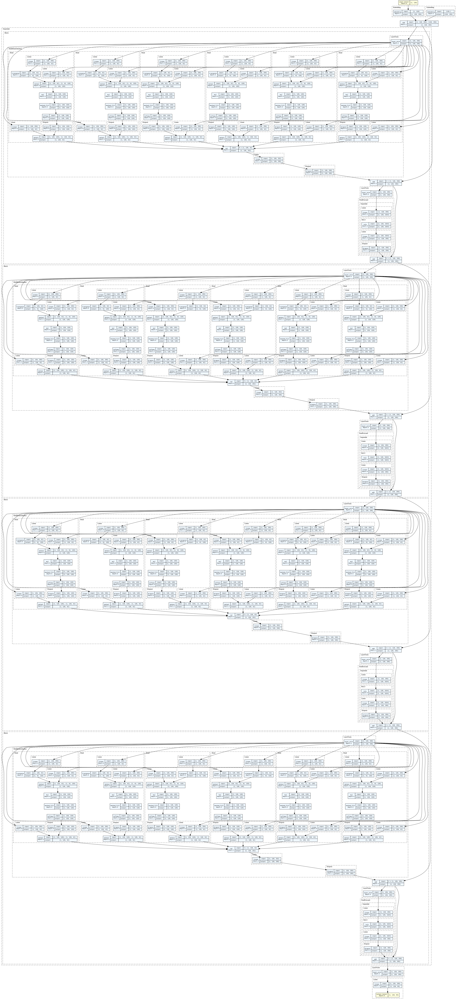

In [24]:
!pip install torchview  # For static visualization
!pip install tensorboard  # For interactive visualization
from torchview import draw_graph
from IPython.display import Image, display # Import Image and display from IPython.display

# Create sample input
input_example = torch.zeros((1, block_size), dtype=torch.long).to(device)

# Generate graph visualization
model_graph = draw_graph(
    model,
    input_data=input_example,
    depth=10,               # How many layers to show
    expand_nested=True,     # Show details of nested modules
    hide_module_functions=False  # Show internal operations
)

# Save and display
model_graph.visual_graph.render(filename='model_architecture', format='png')
display(Image('model_architecture.png')) # Use Image class to display the file